
# Задание к финальному проекту по блоку классического ML

Работаем с [данными](https://raw.githubusercontent.com/obulygin/content/main/SeoulBike/seoul_bike_data.csv) сервиса проката велосипедов в Корее за год.

Описание данных:
- Date - дата;
- Rented Bike Count - сколько велосипедов было взято в прокат, целевая переменная;
- Hour - час дня;
- Temperature - температура воздуха в градусах Цельсия;
- Humidity - влажность воздуха;
- Wind Speed - скорость ветра в м/с;
- Visibility - мера различимости объектов на расстоянии в 10 метров;
- Dew point temperature -  температура, зарегистрированная в начале дня, в градусах Цельсия;
- Solar Radiation - интенсивность солнечного света;
- Rainfall - количество осадков в мм;
- Snowfall - количество выпавшего снега в мм;
- Seasons - время года;
- Holiday - является ли день праздничным;
- Functioning Day - маркер, работал ли сервис проката в указанное время.

**Цель работы**: изучить данные и выявить факторы влияющие на спрос велосипедов.

**Задачи**:  
1) Провести предобработку данных: проверить данные на наличие выбросов, ошибочных значений, пропусков, дубликатов и некорректных типов.  
2) Провести EDA: реализовать все уровни анализа (одномерные/многомерные) с использованием визуализаций, изучить распределения и взаимосвязь признаков.  
3) Подготовить данные для построения модели (кодирование признаков, масштабирование, разбиение выборки на обучающую и тестовую).  
4) Реализовать базовую регрессионную модель прогнозирования количества велосипедов, взятых в прокат.  
5) При помощи инструментов Feature Selection и подбора гиперпараметров подобрать наилучшую прогнозную модель по adjusted R2 (основная метрика) и RMSE.

Работа должна быть оформлена в виде аналитического отчёта, каждый этап должен сопровождаться выводами.

Обязательный критерий: добиться adjusted R2 не менее 85%.

**Дополнительные** (необязательные) **критерии**:  
1) Использовать пайплайны.  
2) Для оптимизизации гиперпараметров использовать HyperOpt.   
3) Добиться adjusted R2 не менее 89%.    

Во всех действиях, содердащих случайную составляющую, фиксируйте `random_state=42`.


In [1]:
import pandas as pd
import numpy as np
import seaborn as sns
import matplotlib.pyplot as plt
import plotly.express as px
from phik.binning import bin_data
from phik.report import plot_correlation_matrix
import plotly.graph_objects as go
from plotly.subplots import make_subplots
from sklearn.model_selection import train_test_split, GridSearchCV, cross_val_score
from sklearn.pipeline import Pipeline
from sklearn.compose import ColumnTransformer
from sklearn.preprocessing import StandardScaler, OneHotEncoder
from sklearn.linear_model import LinearRegression
from sklearn.metrics import mean_squared_error, r2_score
from xgboost import XGBRegressor
from sklearn.tree import DecisionTreeRegressor
from sklearn.ensemble import RandomForestRegressor, GradientBoostingRegressor
from sklearn.neighbors import KNeighborsRegressor

import warnings

warnings.filterwarnings("ignore")

1) Провести предобработку данных: проверить данные на наличие выбросов, ошибочных значений, пропусков, дубликатов и некорректных типов.  

In [2]:
df = pd.read_csv("../data/seoul_bike_data.csv", encoding="unicode_escape")
df.tail(5)

,Date,Rented Bike Count,Hour,Temperature(°C),Humidity(%),Wind speed (m/s),Visibility (10m),Dew point temperature(°C),Solar Radiation (MJ/m2),Rainfall(mm),Snowfall (cm),Seasons,Holiday,Functioning Day
8755,30/11/2018,1003,19,4.2,34,2.6,1894,-10.3,0.0,0.0,0.0,Autumn,No Holiday,Yes
8756,30/11/2018,764,20,3.4,37,2.3,2000,-9.9,0.0,0.0,0.0,Autumn,No Holiday,Yes
8757,30/11/2018,694,21,2.6,39,0.3,1968,-9.9,0.0,0.0,0.0,Autumn,No Holiday,Yes
8758,30/11/2018,712,22,2.1,41,1.0,1859,-9.8,0.0,0.0,0.0,Autumn,No Holiday,Yes
8759,30/11/2018,584,23,1.9,43,1.3,1909,-9.3,0.0,0.0,0.0,Autumn,No Holiday,Yes


In [3]:
df.columns = df.columns.str.lower().str.replace(" ", "_").str.replace("(", "_").str.replace(r'[^a-z0-9_]', '', regex=True)
df.sample(5)

,date,rented_bike_count,hour,temperature_c,humidity_,wind_speed__ms,visibility__10m,dew_point_temperature_c,solar_radiation__mjm2,rainfall_mm,snowfall__cm,seasons,holiday,functioning_day
7977,29/10/2018,1021,9,7.5,53,1.6,1981,-1.4,1.01,0.0,0.0,Autumn,No Holiday,Yes
5757,28/07/2018,1211,21,29.1,78,1.1,1362,24.8,0.00,0.0,0.0,Summer,No Holiday,Yes
5717,27/07/2018,295,5,27.2,86,0.8,657,24.6,0.00,0.0,0.0,Summer,No Holiday,Yes
2239,04/03/2018,23,7,8.4,97,2.6,122,7.9,0.00,0.0,0.0,Spring,No Holiday,Yes
5360,12/07/2018,1811,8,26.3,84,2.1,973,23.3,0.48,0.0,0.0,Summer,No Holiday,Yes


In [4]:
df.shape

(8760, 14)

In [5]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 8760 entries, 0 to 8759
Data columns (total 14 columns):
 #   Column                   Non-Null Count  Dtype  
---  ------                   --------------  -----  
 0   date                     8760 non-null   object 
 1   rented_bike_count        8760 non-null   int64  
 2   hour                     8760 non-null   int64  
 3   temperature_c            8760 non-null   float64
 4   humidity_                8760 non-null   int64  
 5   wind_speed__ms           8760 non-null   float64
 6   visibility__10m          8760 non-null   int64  
 7   dew_point_temperature_c  8760 non-null   float64
 8   solar_radiation__mjm2    8760 non-null   float64
 9   rainfall_mm              8760 non-null   float64
 10  snowfall__cm             8760 non-null   float64
 11  seasons                  8760 non-null   object 
 12  holiday                  8760 non-null   object 
 13  functioning_day          8760 non-null   object 
dtypes: float64(6), int64(4),

Столбец  'date' имеет тип 'object', надо будет перевести в дату.   
Присутствуют как числовые, так и категориальные признаки.

In [6]:
df["date"] = pd.to_datetime(df["date"], format="%d/%m/%Y")
df.sample(5)

,date,rented_bike_count,hour,temperature_c,humidity_,wind_speed__ms,visibility__10m,dew_point_temperature_c,solar_radiation__mjm2,rainfall_mm,snowfall__cm,seasons,holiday,functioning_day
1169,2018-01-18,416,17,2.8,46,2.1,858,-7.6,0.14,0.0,0.0,Winter,No Holiday,Yes
2609,2018-03-19,605,17,8.5,59,2.7,1927,0.9,0.16,0.0,0.0,Spring,No Holiday,Yes
6786,2018-09-09,2368,18,26.0,35,0.3,2000,9.3,0.20,0.0,0.0,Autumn,No Holiday,Yes
8497,2018-11-20,422,1,2.9,43,1.0,1750,-8.4,0.00,0.0,0.0,Autumn,No Holiday,Yes
8102,2018-11-03,0,14,18.1,24,2.4,1594,-2.8,1.97,0.0,0.0,Autumn,No Holiday,No


Т.к. с датой как с признаком работать сложно, то выделим из нее день даты, месяц, год и день недели.

In [7]:
df["day"] = df["date"].dt.day
df["month"] = df["date"].dt.month
df["year"] = df["date"].dt.year
df["weekday"] = df["date"].dt.day_name()

df.sample(5)

,date,rented_bike_count,hour,temperature_c,humidity_,wind_speed__ms,visibility__10m,dew_point_temperature_c,solar_radiation__mjm2,rainfall_mm,snowfall__cm,seasons,holiday,functioning_day,day,month,year,weekday
734,2017-12-31,262,14,3.0,28,3.8,1956,-13.7,1.10,0.0,0.0,Winter,Holiday,Yes,31,12,2017,Sunday
667,2017-12-28,402,19,-0.4,62,0.9,1103,-6.8,0.00,0.0,0.0,Winter,No Holiday,Yes,28,12,2017,Thursday
6913,2018-09-15,881,1,21.8,79,1.4,2000,17.9,0.00,0.0,0.0,Autumn,No Holiday,Yes,15,9,2018,Saturday
7368,2018-10-04,0,0,15.5,65,0.8,2000,8.9,0.00,0.0,0.0,Autumn,No Holiday,No,4,10,2018,Thursday
4575,2018-06-09,1890,15,29.6,40,2.5,1546,14.5,1.96,0.0,0.0,Summer,No Holiday,Yes,9,6,2018,Saturday


In [8]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 8760 entries, 0 to 8759
Data columns (total 18 columns):
 #   Column                   Non-Null Count  Dtype         
---  ------                   --------------  -----         
 0   date                     8760 non-null   datetime64[ns]
 1   rented_bike_count        8760 non-null   int64         
 2   hour                     8760 non-null   int64         
 3   temperature_c            8760 non-null   float64       
 4   humidity_                8760 non-null   int64         
 5   wind_speed__ms           8760 non-null   float64       
 6   visibility__10m          8760 non-null   int64         
 7   dew_point_temperature_c  8760 non-null   float64       
 8   solar_radiation__mjm2    8760 non-null   float64       
 9   rainfall_mm              8760 non-null   float64       
 10  snowfall__cm             8760 non-null   float64       
 11  seasons                  8760 non-null   object        
 12  holiday                  8760 non-

In [9]:
df.describe(include="all").T

,count,unique,top,freq,mean,min,25%,50%,75%,max,std
date,8760,NaN,NaN,NaN,2018-05-31 23:59:59.999999744,2017-12-01 00:00:00,2018-03-02 00:00:00,2018-06-01 00:00:00,2018-08-31 00:00:00,2018-11-30 00:00:00,NaN
rented_bike_count,8760.0,NaN,NaN,NaN,704.602055,0.0,191.0,504.5,1065.25,3556.0,644.997468
hour,8760.0,NaN,NaN,NaN,11.5,0.0,5.75,11.5,17.25,23.0,6.922582
temperature_c,8760.0,NaN,NaN,NaN,12.882922,-17.8,3.5,13.7,22.5,39.4,11.944825
humidity_,8760.0,NaN,NaN,NaN,58.226256,0.0,42.0,57.0,74.0,98.0,20.362413
wind_speed__ms,8760.0,NaN,NaN,NaN,1.724909,0.0,0.9,1.5,2.3,7.4,1.0363
visibility__10m,8760.0,NaN,NaN,NaN,1436.825799,27.0,940.0,1698.0,2000.0,2000.0,608.298712
dew_point_temperature_c,8760.0,NaN,NaN,NaN,4.073813,-30.6,-4.7,5.1,14.8,27.2,13.060369
solar_radiation__mjm2,8760.0,NaN,NaN,NaN,0.569111,0.0,0.0,0.01,0.93,3.52,0.868746
rainfall_mm,8760.0,NaN,NaN,NaN,0.148687,0.0,0.0,0.0,0.0,35.0,1.128193


In [10]:
df.duplicated().sum()

0

In [11]:
df.isna().sum()

date                       0
rented_bike_count          0
hour                       0
temperature_c              0
humidity_                  0
wind_speed__ms             0
visibility__10m            0
dew_point_temperature_c    0
solar_radiation__mjm2      0
rainfall_mm                0
snowfall__cm               0
seasons                    0
holiday                    0
functioning_day            0
day                        0
month                      0
year                       0
weekday                    0
dtype: int64

Дубликатов и пропусков нет.

In [12]:
cat_col1 = ["seasons", "holiday", "functioning_day", "weekday"]


def unique_values(df):
    for col in cat_col1:
        unique_vals = df[col].unique()
        print(f'Уникальные значения в столбце "{col}": {unique_vals}')

In [13]:
unique_values(df)

Уникальные значения в столбце "seasons": ['Winter' 'Spring' 'Summer' 'Autumn']
Уникальные значения в столбце "holiday": ['No Holiday' 'Holiday']
Уникальные значения в столбце "functioning_day": ['Yes' 'No']
Уникальные значения в столбце "weekday": ['Friday' 'Saturday' 'Sunday' 'Monday' 'Tuesday' 'Wednesday' 'Thursday']


In [14]:
num_col1 = [
    "rented_bike_count",
    "temperature_c",
    "humidity_",
    "wind_speed__ms",
    "visibility__10m",
    "dew_point_temperature_c",
    "solar_radiation__mjm2",
    "rainfall_mm",
    "snowfall__cm",
    "hour",
    "day",
    "month",
    "year",
]


def nunique_values(df):
    for col in num_col1:
        unique_vals = df[col].nunique()
        print(f'Количество уникальных значений в столбце "{col}": {unique_vals}')

In [15]:
nunique_values(df)

Количество уникальных значений в столбце "rented_bike_count": 2166
Количество уникальных значений в столбце "temperature_c": 546
Количество уникальных значений в столбце "humidity_": 90
Количество уникальных значений в столбце "wind_speed__ms": 65
Количество уникальных значений в столбце "visibility__10m": 1789
Количество уникальных значений в столбце "dew_point_temperature_c": 556
Количество уникальных значений в столбце "solar_radiation__mjm2": 345
Количество уникальных значений в столбце "rainfall_mm": 61
Количество уникальных значений в столбце "snowfall__cm": 51
Количество уникальных значений в столбце "hour": 24
Количество уникальных значений в столбце "day": 31
Количество уникальных значений в столбце "month": 12
Количество уникальных значений в столбце "year": 2


In [16]:
def count_unique(df):
    results = []
    for column in cat_col1:
        counts = df[column].value_counts()
        total_count = counts.sum()
        for value, count in counts.items():
            part = count * 100 / total_count
            results.append([column, value, count, part])
    results_df = pd.DataFrame(
        results, columns=["Столбец", "Уникальное значение", "Количество", "Процент"]
    )
    return results_df

In [17]:
df_part = count_unique(df)
df_part

,Столбец,Уникальное значение,Количество,Процент
0,seasons,Spring,2208,25.205479
1,seasons,Summer,2208,25.205479
2,seasons,Autumn,2184,24.931507
3,seasons,Winter,2160,24.657534
4,holiday,No Holiday,8328,95.068493
5,holiday,Holiday,432,4.931507
6,functioning_day,Yes,8465,96.632420
7,functioning_day,No,295,3.367580
8,weekday,Friday,1272,14.520548
9,weekday,Saturday,1248,14.246575


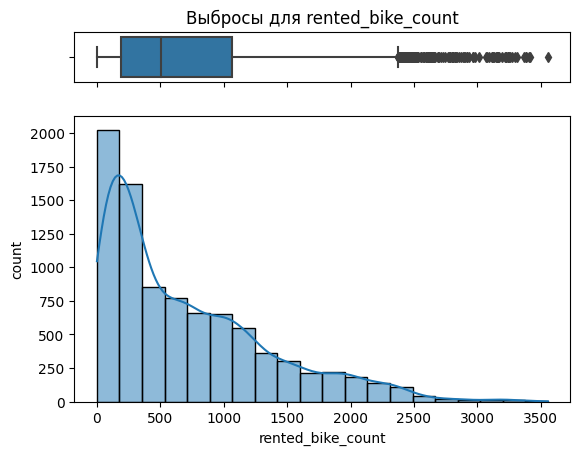

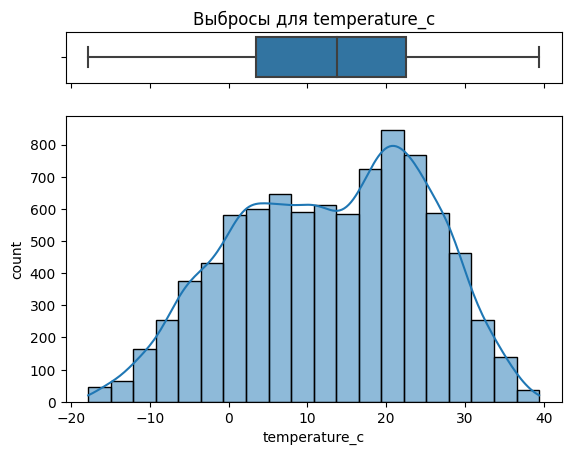

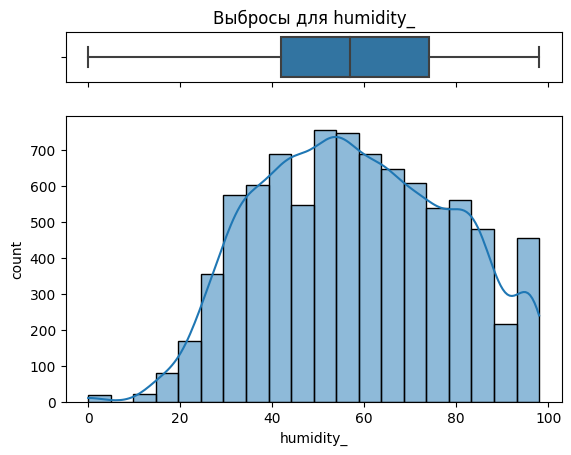

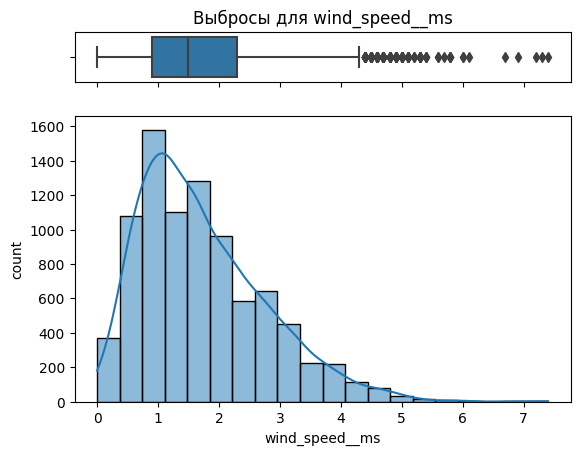

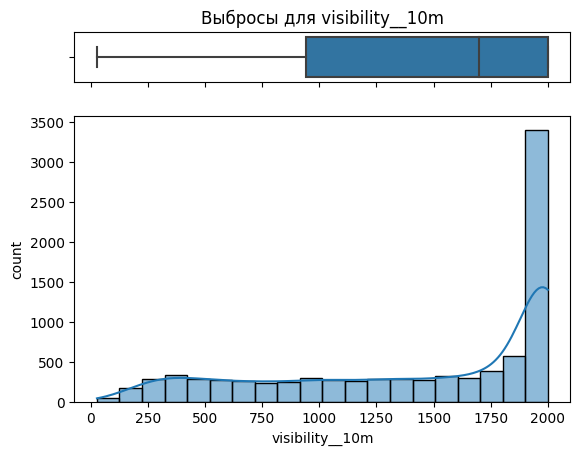

...

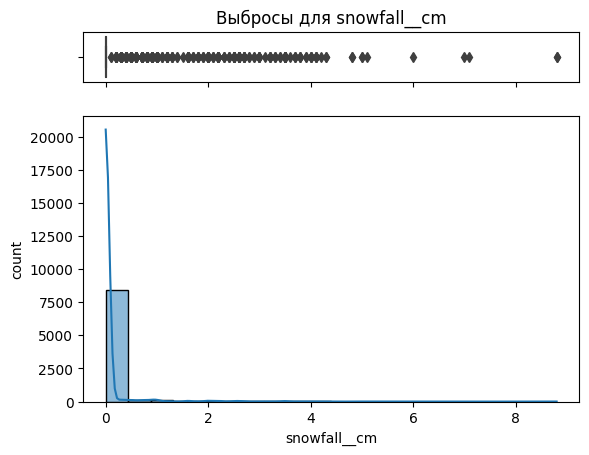

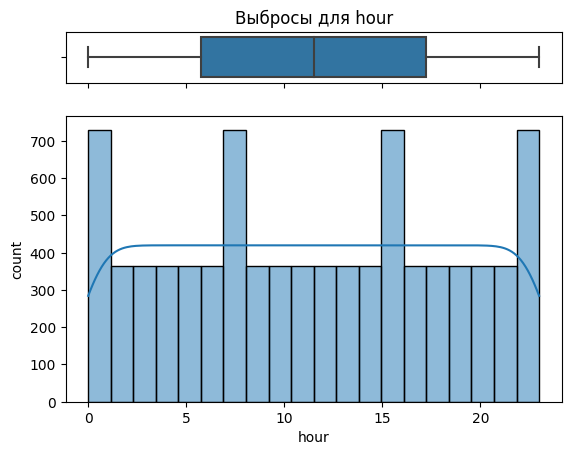

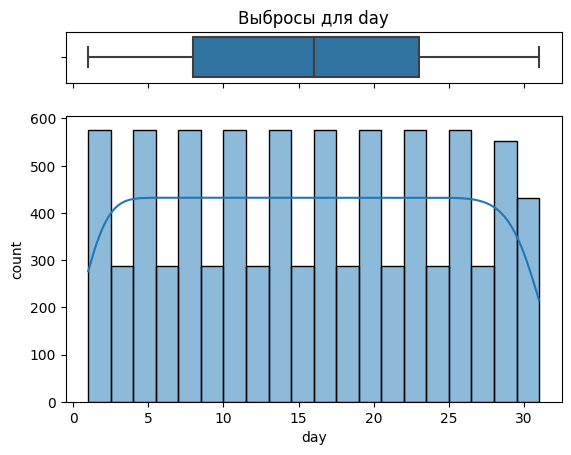

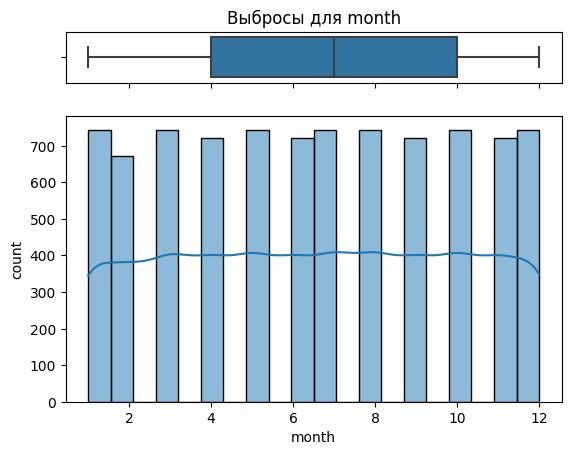

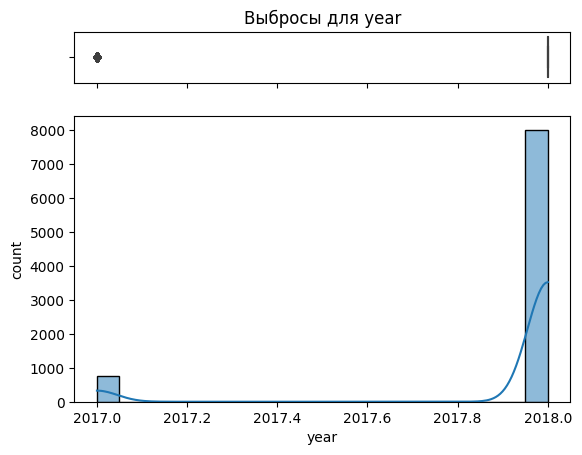

In [18]:
for col in num_col1:
    fig, (ax_box, ax_hist) = plt.subplots(
        2, sharex=True, gridspec_kw={"height_ratios": (0.15, 0.85)}
    )
    sns.boxplot(x=df[col], ax=ax_box)
    sns.histplot(data=df, x=col, bins=20, kde=True, ax=ax_hist)
    ax_box.set(xlabel="")
    ax_hist.set(xlabel=col)
    ax_hist.set(ylabel="count")
    ax_box.set(title=f"Выбросы для {col}")

    plt.show()

Видим, что:  
1. распределение переменных 'rented_bike_count', 'temperature_c', 'humidity_', 'wind_speed__ms', 'dew_point_temperature_c' напоминают колоколообразную форму (что может быть признаком нормального распределения)   
2. 'visibility__10m', 'solar_radiation__mjm2', 'rainfall_mm', 'snowfall__cm' - значения этих признаков распределены таким образом, что можно выделить 2 группы - с наиболее часто встречающимимся значениями и с наименнее часто

In [19]:
num_col2 = [
    "visibility__10m",
    "solar_radiation__mjm2",
    "rainfall_mm",
    "snowfall__cm",
]

fig = make_subplots(rows=2, cols=2, subplot_titles=num_col2)

for i, col in enumerate(num_col2):
    row = i // 2 + 1
    col_idx = i % 2 + 1
    hist = go.Histogram(x=df[col], y=df['rented_bike_count'], name=col, nbinsx=50)
    fig.add_trace(hist, row=row, col=col_idx)

fig.update_layout(
    title_text='Гистограммы числовых переменных',
    showlegend=False, 
    height=800, 
)

fig.show()

Из этих гистограмм видно, что большинство велосипедов берут в аренду при:  
1. видимости 2000-2049  
2. интенсивности солнечного света -0,05-0,04  
3. осадках 0,5-0,4  
4. количестве снега -0,1-0,8317  

Разделим на группы по таким границам.  

In [20]:
# Разбиение видимости на группы
bins = [0, 2000, df['visibility__10m'].max() + 1]
labels = ['Плохая', 'Хорошая']

df['visibility_cat'] = pd.cut(df['visibility__10m'], bins, labels=labels, right=False)

df['visibility_cat'].value_counts()

visibility_cat
Плохая     6515
Хорошая    2245
Name: count, dtype: int64

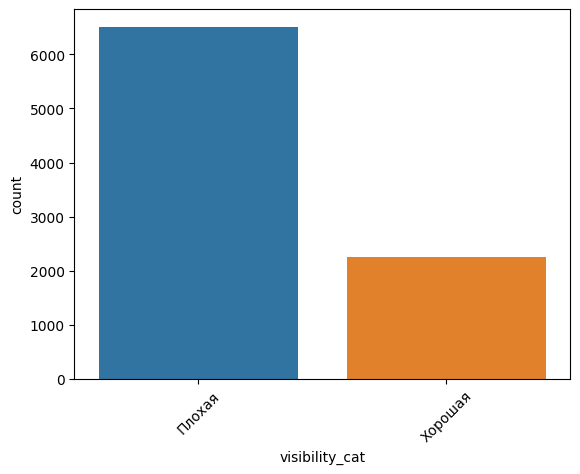

In [21]:
# Построение диаграммы для визуализации количества
sns.countplot(x='visibility_cat', data=df)
plt.xticks(rotation=45);

In [22]:
# Разбиение солнечной интенсивности на группы
bins = [-0.05, 0.04, df['solar_radiation__mjm2'].max() + 1]
labels = ['Нормальная', 'Высокая']

df['solar_radiation_cat'] = pd.cut(df['solar_radiation__mjm2'], bins, labels=labels, right=False)

df['solar_radiation_cat'].value_counts()

solar_radiation_cat
Нормальная    4579
Высокая       4181
Name: count, dtype: int64

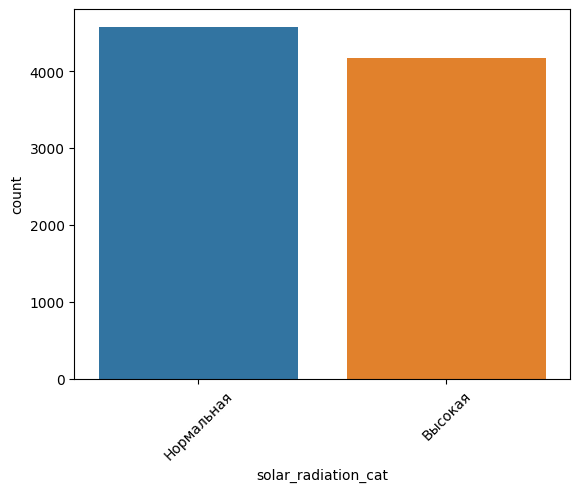

In [23]:
# Построение диаграммы для визуализации количества
sns.countplot(x='solar_radiation_cat', data=df)
plt.xticks(rotation=45);

In [24]:
# Разбиение осадков на группы
bins = [-0.5, 0.4, df['rainfall_mm'].max() + 1]
labels = ['Среднее', 'Высокое']

df['rainfall_cat'] = pd.cut(df['rainfall_mm'], bins, labels=labels, right=False)

df['rainfall_cat'].value_counts()

rainfall_cat
Среднее    8307
Высокое     453
Name: count, dtype: int64

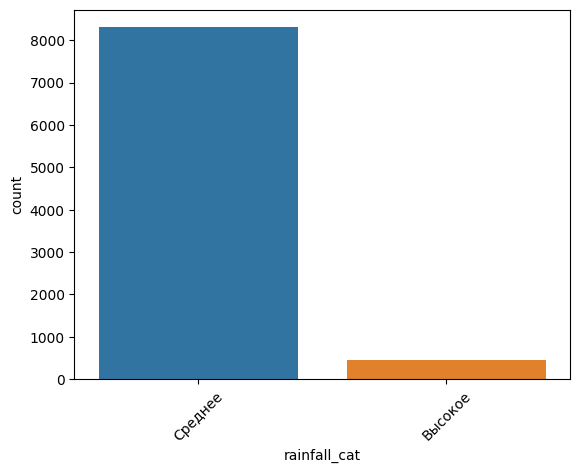

In [25]:
# Построение диаграммы для визуализации количества
sns.countplot(x='rainfall_cat', data=df)
plt.xticks(rotation=45);

In [26]:
# Разбиение количества снега на группы
bins = [-0.5, 0.4, df['snowfall__cm'].max() + 1]
labels = ['Среднее', 'Высокое']

df['snowfall_cat'] = pd.cut(df['snowfall__cm'], bins, labels=labels, right=False)

df['snowfall_cat'].value_counts()

snowfall_cat
Среднее    8376
Высокое     384
Name: count, dtype: int64

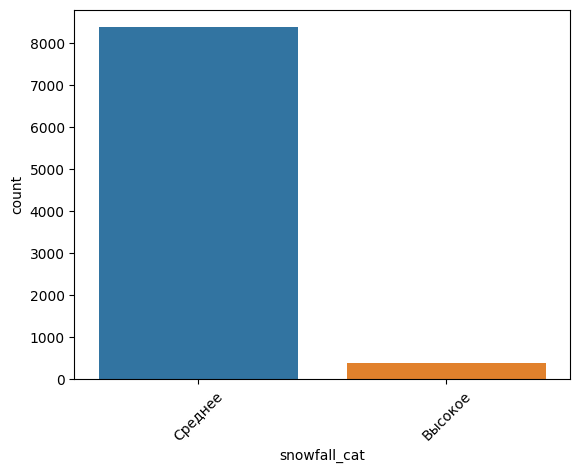

In [27]:
# Построение диаграммы для визуализации количества
sns.countplot(x='snowfall_cat', data=df)
plt.xticks(rotation=45);

In [28]:
df.head(5)

,date,rented_bike_count,hour,temperature_c,humidity_,wind_speed__ms,visibility__10m,dew_point_temperature_c,solar_radiation__mjm2,rainfall_mm,...,holiday,functioning_day,day,month,year,weekday,visibility_cat,solar_radiation_cat,rainfall_cat,snowfall_cat
0,2017-12-01,254,0,-5.2,37,2.2,2000,-17.6,0.0,0.0,...,No Holiday,Yes,1,12,2017,Friday,Хорошая,Нормальная,Среднее,Среднее
1,2017-12-01,204,1,-5.5,38,0.8,2000,-17.6,0.0,0.0,...,No Holiday,Yes,1,12,2017,Friday,Хорошая,Нормальная,Среднее,Среднее
2,2017-12-01,173,2,-6.0,39,1.0,2000,-17.7,0.0,0.0,...,No Holiday,Yes,1,12,2017,Friday,Хорошая,Нормальная,Среднее,Среднее
3,2017-12-01,107,3,-6.2,40,0.9,2000,-17.6,0.0,0.0,...,No Holiday,Yes,1,12,2017,Friday,Хорошая,Нормальная,Среднее,Среднее
4,2017-12-01,78,4,-6.0,36,2.3,2000,-18.6,0.0,0.0,...,No Holiday,Yes,1,12,2017,Friday,Хорошая,Нормальная,Среднее,Среднее


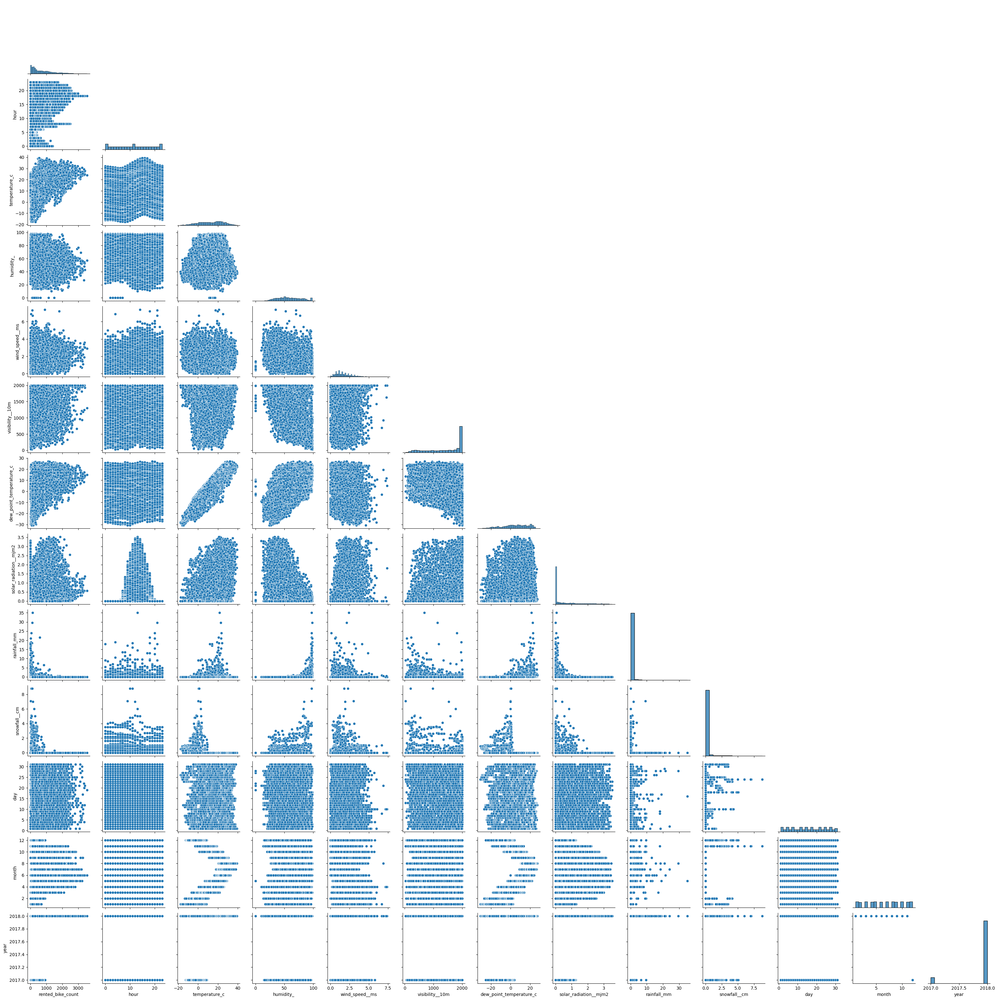

In [29]:
sns.pairplot(df, corner=True);

Очевидна линейная зависомость 'temperature_c' и 'dew_point_temperature_c'. Проверим коэффициент корреляции Пирсона.

In [30]:
df[['temperature_c', 'dew_point_temperature_c']].corr().iloc[0, 1].round(2)

0.91

В дальнейшем для целей построения модели удалим признак 'dew_point_temperature_c'.

In [31]:
cat_col2 = [
    "visibility_cat",
    "solar_radiation_cat",
    "rainfall_cat",
    "snowfall_cat",
    "seasons",
    "holiday",
    "functioning_day",
    'weekday'
]


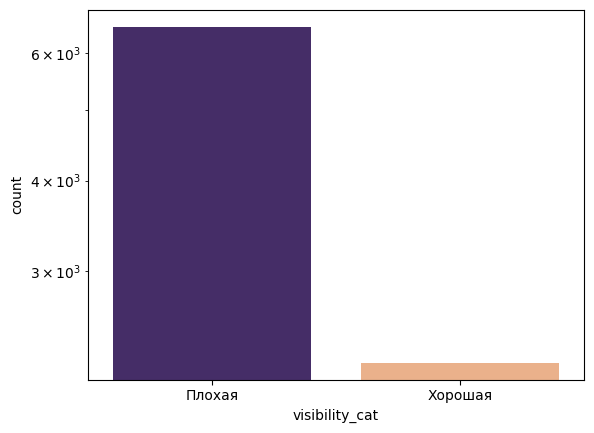

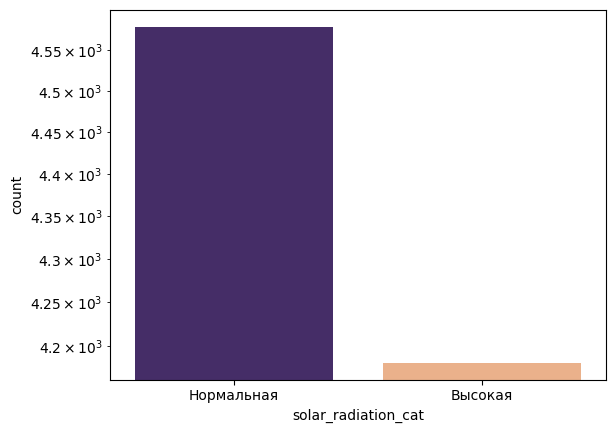

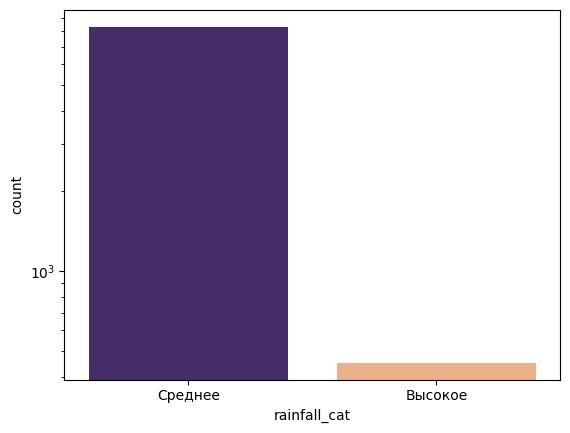

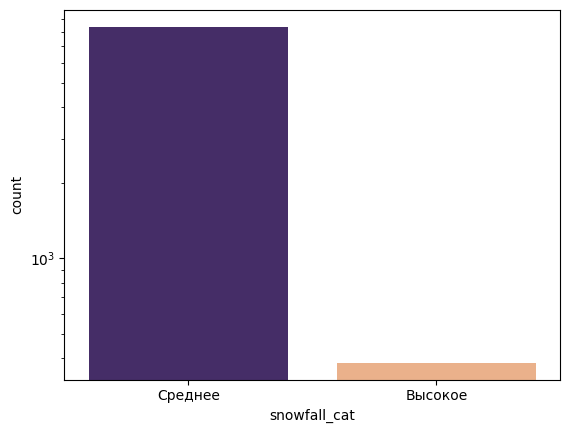

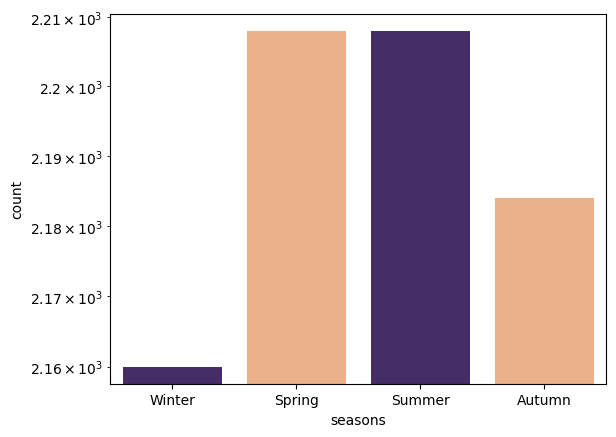

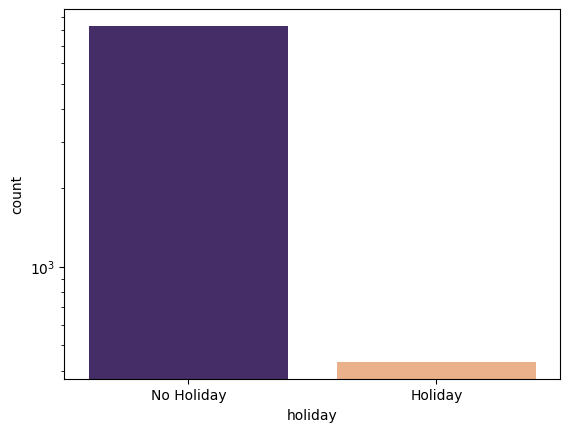

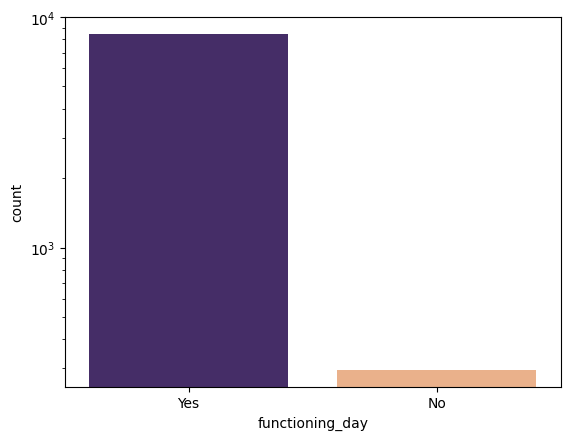

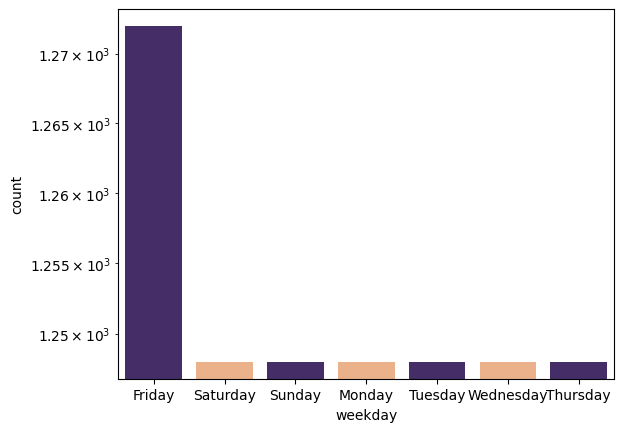

In [32]:
for col in cat_col2:
    sns.countplot(df, x=col, palette=["#432371", "#FAAE7B"])
    plt.yscale("log")
    plt.show()

Проверим есть ли аренда в дни, отмеченные "functioning_day"= "No"

In [33]:
df.loc[(df["functioning_day"] == "No") & (df["rented_bike_count"] != 0)]

,date,rented_bike_count,hour,temperature_c,humidity_,wind_speed__ms,visibility__10m,dew_point_temperature_c,solar_radiation__mjm2,rainfall_mm,...,holiday,functioning_day,day,month,year,weekday,visibility_cat,solar_radiation_cat,rainfall_cat,snowfall_cat


Аренды в эти дни нет.  
Посмотрим при каких параметрах были нефункциональные дни. Возможно, при очень сильном ветре или очень низкой температуре была только нулевая аренда, тогда можно будет удалить строки с такими аномальными параметрами погоды.

In [34]:
for col in num_col1:
    fig = px.histogram(df, x=col, color="functioning_day", nbins=50)
    fig.show()

In [35]:
for col in num_col1:
    fig = px.box(df, x=col, color="functioning_day")
    fig.show()

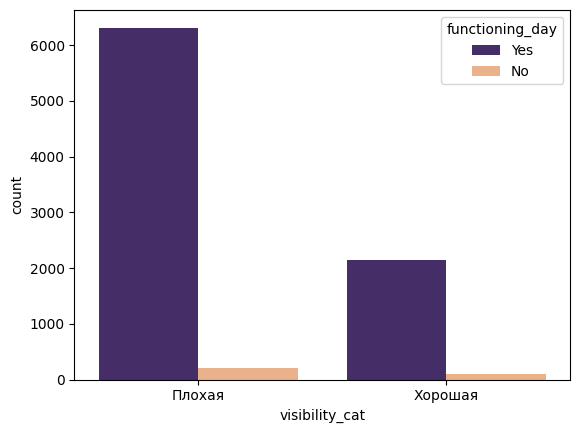

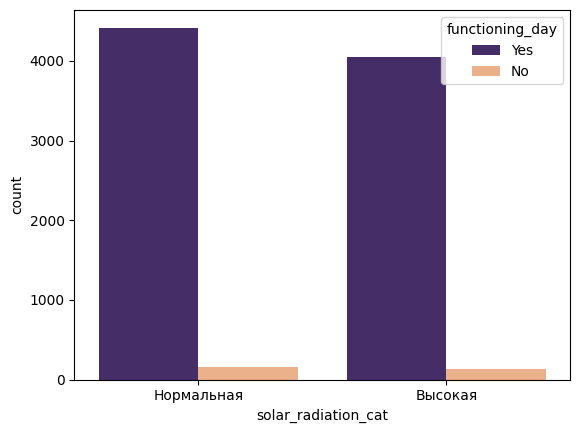

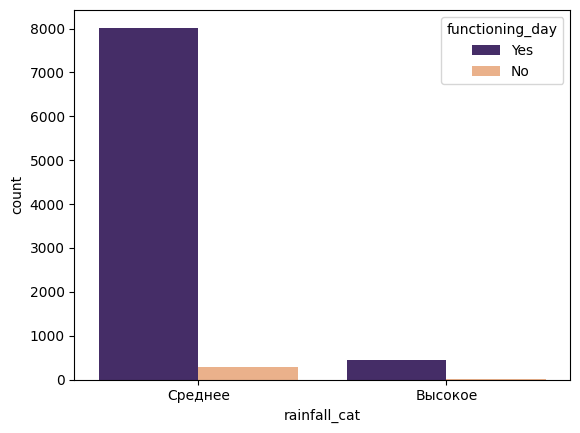

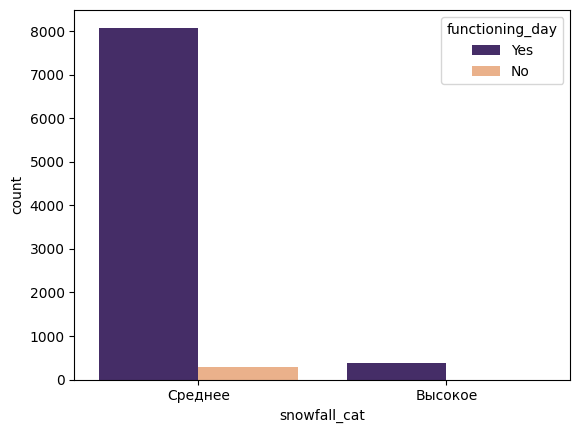

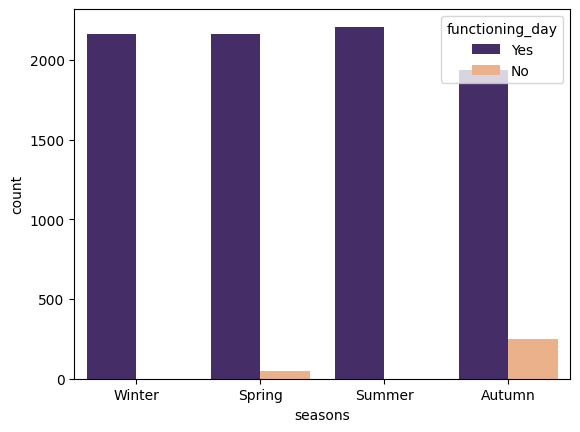

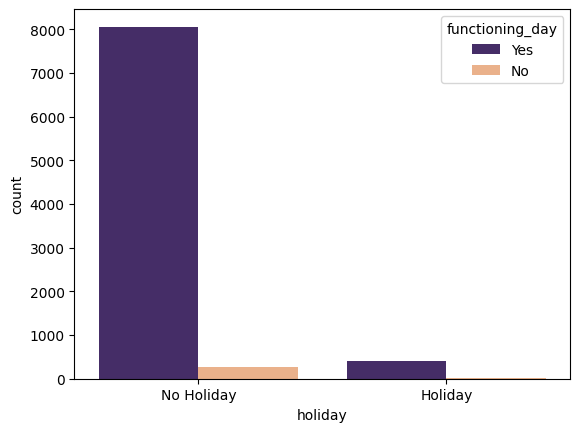

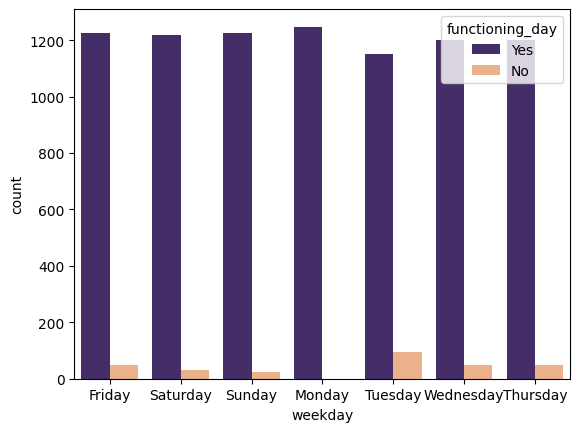

In [36]:
cat_col3 = [
    "visibility_cat",
    "solar_radiation_cat",
    "rainfall_cat",
    "snowfall_cat",
    "seasons",
    "holiday",
    'weekday'
]

for col in cat_col3:
    sns.countplot(df, x=col, palette=["#432371", "#FAAE7B"], hue="functioning_day")
    # plt.yscale('log')
    plt.show()

Видим, что нет таких значений параметров погоды, при которых была только нулевая аренда.

Посмотри на корреляции признаков между собой и целевой переменной.

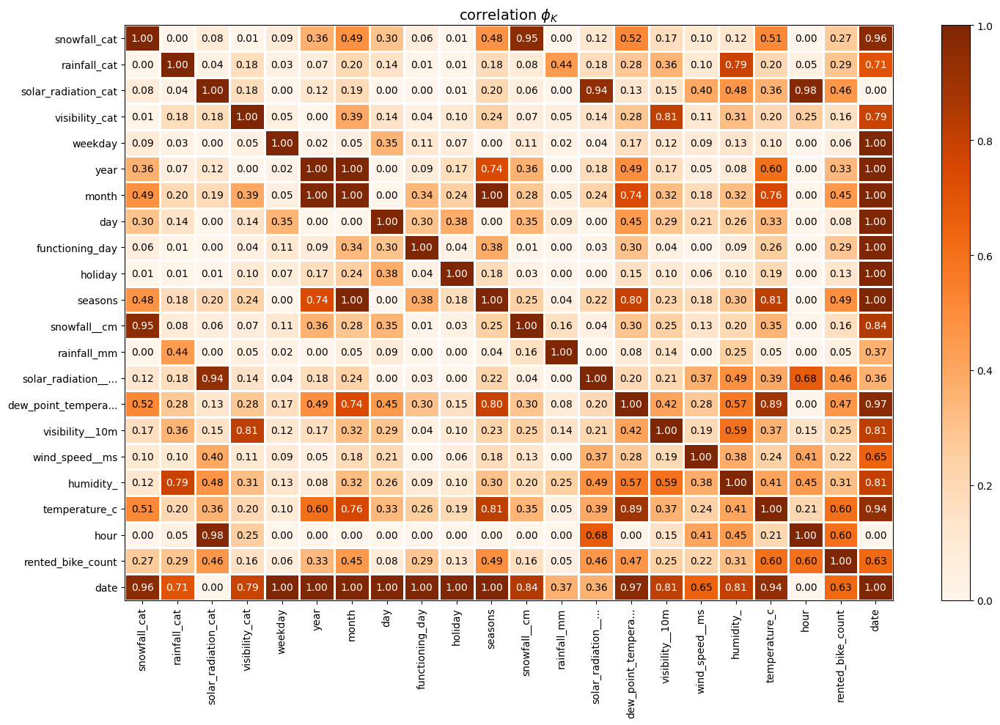

In [37]:
# Построение матрицы корреляции признаков (Phik)
data_types = {
    "rented_bike_count": "interval",
    "temperature_c": "interval",
    "humidity_": "interval",
    "wind_speed__ms": "interval",
    "visibility__10m": "interval",
    "dew_point_temperature_c": "interval",
    "solar_radiation__mjm2": "interval",
    "rainfall_mm": "interval",
    "snowfall__cm": "interval"
}

interval_cols = [
    col for col, v in data_types.items() if v == "interval" and col in df.columns
]

data_binned, binning_dict = bin_data(df, cols=interval_cols, retbins=True)

phik_overview = df.phik_matrix(interval_cols=interval_cols)

plot_correlation_matrix(
    phik_overview.values,
    x_labels=phik_overview.columns,
    y_labels=phik_overview.index,
    vmin=0,
    vmax=1,
    color_map="Oranges",
    title=r"correlation $\phi_K$",
    figsize=(15, 10),
)
plt.tight_layout()

Как было показано ранее есть линейная зависомость 'temperature_c' и 'dew_point_temperature_c'. А т.к. с целевой переменной слабее коррелирует признак 'dew_point_temperature_c' (0,47), поэтому удалим его из итоговой таблицы для модели.  

3) Подготовить данные для построения модели (кодирование признаков, масштабирование, разбиение выборки на обучающую и тестовую).  

In [38]:
df_final =  df.copy()

In [39]:
df_final = df_final.drop(columns=['date', 'dew_point_temperature_c',
       'functioning_day', 'visibility_cat', 'solar_radiation_cat', 'rainfall_cat',
       'snowfall_cat', 'year'])
df_final.head(5)

,rented_bike_count,hour,temperature_c,humidity_,wind_speed__ms,visibility__10m,solar_radiation__mjm2,rainfall_mm,snowfall__cm,seasons,holiday,day,month,weekday
0,254,0,-5.2,37,2.2,2000,0.0,0.0,0.0,Winter,No Holiday,1,12,Friday
1,204,1,-5.5,38,0.8,2000,0.0,0.0,0.0,Winter,No Holiday,1,12,Friday
2,173,2,-6.0,39,1.0,2000,0.0,0.0,0.0,Winter,No Holiday,1,12,Friday
3,107,3,-6.2,40,0.9,2000,0.0,0.0,0.0,Winter,No Holiday,1,12,Friday
4,78,4,-6.0,36,2.3,2000,0.0,0.0,0.0,Winter,No Holiday,1,12,Friday


In [40]:
y = df_final['rented_bike_count']
X = df_final.drop(['rented_bike_count'], axis=1)

Порядковые категориальные признаки закодируем OrdinalEncoder().

In [41]:
cat_col4 = ['seasons', 'holiday', 'weekday']
num_col4 = ['hour', 'temperature_c', 'humidity_', 'solar_radiation__mjm2', 'wind_speed__ms', 'visibility__10m', 'rainfall_mm', 'snowfall__cm', 'day', 'month']

In [42]:
categorical_nominal_transformer = Pipeline(
    steps=[
        ("onehot", OneHotEncoder(drop="first", handle_unknown="ignore")),
    ]
)

numeric_transformer = Pipeline(
    steps=[
        ("scaler", StandardScaler()),
    ]
)

preprocessor = ColumnTransformer(
    transformers=[
        ("num", numeric_transformer, num_col4),
        ("nominal_cat", categorical_nominal_transformer, cat_col4)
    ]
)

In [43]:
# Разделение на 3 выборки: тренировочная, валидационная, тестовая
X_train, X_temp, y_train, y_temp = train_test_split(X, y, test_size=0.4, random_state=42)
X_val, X_test, y_val, y_test = train_test_split(X_temp, y_temp, test_size=0.5, random_state=42)

4) Реализовать базовую регрессионную модель прогнозирования количества велосипедов, взятых в прокат.  

5) При помощи инструментов Feature Selection и подбора гиперпараметров подобрать наилучшую прогнозную модель по adjusted R2 (основная метрика) и RMSE.

Работа должна быть оформлена в виде аналитического отчёта, каждый этап должен сопровождаться выводами.

Обязательный критерий: добиться adjusted R2 не менее 85%.  

**Дополнительные** (необязательные) **критерии**:  
1) Использовать пайплайны.  
2) Для оптимизизации гиперпараметров использовать HyperOpt.   
3) Добиться adjusted R2 не менее 89%.    

Во всех действиях, содердащих случайную составляющую, фиксируйте `random_state=42`.

In [44]:
models = {
    "Linear Regression": (
        Pipeline(steps=[("preprocessor", preprocessor), ("model", LinearRegression())]),
        {"model__fit_intercept": [True, False]},
    ),
    "Decision Tree": (
        Pipeline(
            steps=[
                ("preprocessor", preprocessor),
                ("model", DecisionTreeRegressor(random_state=42)),
            ]
        ),
        {"model__max_depth": [None, 5, 10], "model__min_samples_split": [2, 5]},
    ),
    "Random Forest": (
        Pipeline(
            steps=[
                ("preprocessor", preprocessor),
                ("model", RandomForestRegressor(random_state=42)),
            ]
        ),
        {"model__n_estimators": [50, 100], "model__max_depth": [5, 10, 20]},
    ),
    "XGBoost": (
        Pipeline(
            steps=[
                ("preprocessor", preprocessor),
                ("model", XGBRegressor(random_state=42)),
            ]
        ),
        {"model__n_estimators": [50, 100], "model__learning_rate": [0.01, 0.1]},
    ),
    "GradientBoostingRegressor": (
        Pipeline(
            steps=[
                ("preprocessor", preprocessor),
                ("model", GradientBoostingRegressor(random_state=42)),
            ]
        ),
        {"model__n_estimators": [50, 100], "model__learning_rate": [0.01, 0.1]},
    ),
    "KNeighborsRegressor": (
        Pipeline(
            steps=[
                ("preprocessor", preprocessor),
                ("model", KNeighborsRegressor()),
            ]
        ),
        {"model__n_neighbors": [3, 5, 7, 10]},
    ),
}

results = {}
for name, (model, params) in models.items():
    grid_search = GridSearchCV(
        model, params, cv=5, scoring="neg_root_mean_squared_error", n_jobs=-1
    )
    grid_search.fit(X_train, y_train)
    y_pred = grid_search.predict(X_val)
    rmse = np.sqrt(mean_squared_error(y_val, y_pred))
    r2 = r2_score(y_val, y_pred)

    def adjusted_r2(r2, n, p):
        return 1 - (1 - r2) * (n - 1) / (n - p - 1)

    adjusted_r2_val = adjusted_r2(r2, len(y_val), X_val.shape[1])
    results[name] = {
        "RMSE": rmse,
        "Adjusted_R2": adjusted_r2_val,
        "Best Params": grid_search.best_params_,
    }

for name, metrics in results.items():
    print(
        f"{name}: RMSE = {metrics['RMSE']}, Adjusted_R2 = {metrics['Adjusted_R2']}, Best Params = {metrics['Best Params']}"
    )

Linear Regression: RMSE = 472.32577082204284, Adjusted_R2 = 0.47173132068869905, Best Params = {'model__fit_intercept': True}
Decision Tree: RMSE = 348.1259274564821, Adjusted_R2 = 0.7130248328518876, Best Params = {'model__max_depth': 10, 'model__min_samples_split': 5}
Random Forest: RMSE = 257.1340589270598, Adjusted_R2 = 0.8434364035281264, Best Params = {'model__max_depth': 20, 'model__n_estimators': 100}
XGBoost: RMSE = 215.9600918981766, Adjusted_R2 = 0.889561986637301, Best Params = {'model__learning_rate': 0.1, 'model__n_estimators': 100}
GradientBoostingRegressor: RMSE = 309.48753898335974, Adjusted_R2 = 0.7731922378661963, Best Params = {'model__learning_rate': 0.1, 'model__n_estimators': 100}
KNeighborsRegressor: RMSE = 356.35370965884516, Adjusted_R2 = 0.6992995023857447, Best Params = {'model__n_neighbors': 3}


In [45]:
best_model_name = min(results, key=lambda x: results[x]['RMSE'])
print(f"Наилучшая модель: {best_model_name}")

Наилучшая модель: XGBoost


In [46]:
best_model_pipeline, best_model_params = models[best_model_name][0], results[best_model_name]['Best Params']

best_model_pipeline.set_params(**best_model_params)
best_model_pipeline.fit(X_train, y_train)

y_test_pred = best_model_pipeline.predict(X_test)

In [47]:
rmse_test = np.sqrt(mean_squared_error(y_test, y_test_pred))
adjusted_r2_test = adjusted_r2(r2_score(y_test, y_test_pred), X_test.shape[0], X_test.shape[1])

print(f'RMSE на тестовой выборке: {rmse_test}')
print(f'Adjusted R2 на тестовой выборке: {adjusted_r2_test}')

RMSE на тестовой выборке: 220.5087202396174
Adjusted R2 на тестовой выборке: 0.8788881006297792
